In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nfl-player-contact-detection/test_baseline_helmets.csv
/kaggle/input/nfl-player-contact-detection/sample_submission.csv
/kaggle/input/nfl-player-contact-detection/train_baseline_helmets.csv
/kaggle/input/nfl-player-contact-detection/test_player_tracking.csv
/kaggle/input/nfl-player-contact-detection/train_player_tracking.csv
/kaggle/input/nfl-player-contact-detection/train_video_metadata.csv
/kaggle/input/nfl-player-contact-detection/test_video_metadata.csv
/kaggle/input/nfl-player-contact-detection/train_labels.csv
/kaggle/input/nfl-player-contact-detection/test/58172_003247_All29.mp4
/kaggle/input/nfl-player-contact-detection/test/58172_003247_Sideline.mp4
/kaggle/input/nfl-player-contact-detection/test/58172_003247_Endzone.mp4
/kaggle/input/nfl-player-contact-detection/test/58168_003392_Endzone.mp4
/kaggle/input/nfl-player-contact-detection/test/58168_003392_Sideline.mp4
/kaggle/input/nfl-player-contact-detection/test/58168_003392_All29.mp4
/kaggle/input/nfl-player-con

In [2]:
!mkdir -p frames
!ffmpeg -i /kaggle/input/nfl-player-contact-detection/train/58168_003392_Sideline.mp4 -q:v 2 -f image2 /kaggle/working/frames/frame_%04d.jpg -hide_banner -loglevel error

In [3]:
! pip install torch==1.10.1+cu111 torchvision==0.11.2+cu111 torchaudio==0.10.1 -f https://download.pytorch.org/whl/torch_stable.html

! git clone -b mask https://github.com/WongKinYiu/yolov7.git
! pip install pyyaml==5.1
! pip install 'git+https://github.com/facebookresearch/detectron2.git'

%cd yolov7
! curl -L https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7-mask.pt -o yolov7-mask.pt

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 GB 468.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 42.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 49.3 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0
    Uninstalling torch-1.11.0:
      Successfully uninstalled torch-1.11.0
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0
    Uninstalling torchvision-0.12.0:
      Successfully uninstalled torchvision-0.12.0
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 0.11.0
    Uninstalling torchaudio-0.11.0:
      Successfully uninstalled torchaudio-0.11.0
Cloning into 'yolov7'...
remote: Enumerating objects: 1127, done.
remote: Total 1127 (delta 0), reused 0 (delta 0), pack-reused 1127
Receiving objects: 100% (1127/1127), 69.93 MiB | 21.30 MiB/s,

In [4]:
import matplotlib.pyplot as plt
import torch
import cv2
import yaml
from torchvision import transforms
import numpy as np

from glob import glob

from utils.datasets import letterbox
from utils.general import non_max_suppression_mask_conf

from detectron2.modeling.poolers import ROIPooler
from detectron2.structures import Boxes
from detectron2.utils.memory import retry_if_cuda_oom
from detectron2.layers import paste_masks_in_image

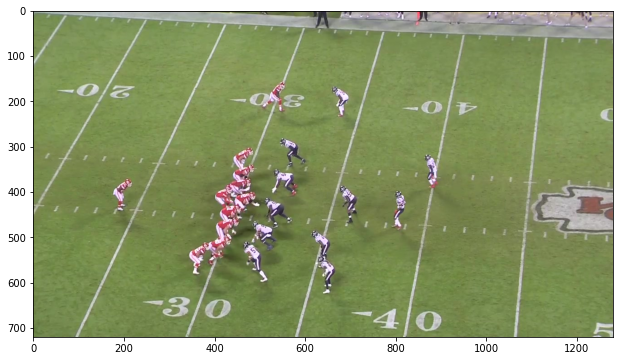

In [5]:
frames_paths = sorted(glob('/kaggle/working/frames/*'))

i = 300
frame = cv2.imread(frames_paths[i])
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

fig = plt.figure(figsize=(12, 6))
plt.imshow(frame);

In [6]:
!ls /kaggle/working/frames/ | wc -l


711


In [7]:
import pandas as pd

tr_helmets = pd.read_csv('/kaggle/input/nfl-player-contact-detection/train_baseline_helmets.csv')
tr_helmets.head()

,game_play,game_key,play_id,view,video,...,player_label,left,width,top,height
0,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,...,H72,946,25,293,34
1,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,...,H42,151,25,267,33
2,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,...,H70,810,25,293,35
3,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,...,H15,681,26,254,33
4,58168_003392,58168,3392,Endzone,58168_003392_Endzone.mp4,...,V92,680,23,303,33


In [8]:
frames_paths[i]


'/kaggle/working/frames/frame_0301.jpg'

In [9]:
frame_helmets = tr_helmets.query('video == "58168_003392_Sideline.mp4" and frame == 301')
frame_helmets.head()

,game_play,game_key,play_id,view,video,...,player_label,left,width,top,height
482,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,V21,628,14,542,17
483,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,V99,484,14,463,16
484,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,H15,424,14,384,19
485,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,H71,440,15,456,19
486,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,H48,421,15,497,19


In [10]:
frame_helmets.head()


,game_play,game_key,play_id,view,video,...,player_label,left,width,top,height
482,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,V21,628,14,542,17
483,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,V99,484,14,463,16
484,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,H15,424,14,384,19
485,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,H71,440,15,456,19
486,58168_003392,58168,3392,Sideline,58168_003392_Sideline.mp4,...,H48,421,15,497,19


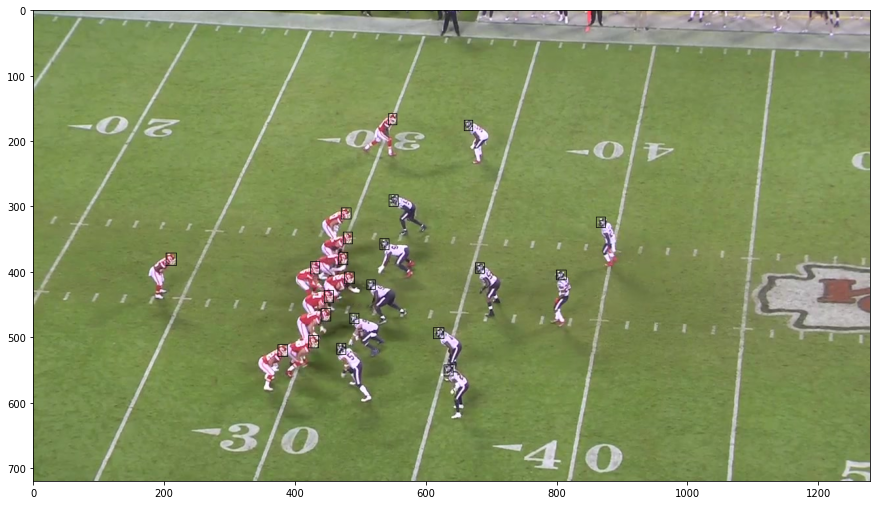

In [11]:
pred_img = frame.copy()

for helmet in frame_helmets.itertuples():
    startpoint = (helmet.left, helmet.top)
    endpoint = (helmet.left + helmet.width, helmet.top + helmet.height)
    cv2.rectangle(pred_img, startpoint, endpoint, (0, 0, 0), 1)
    

plt.figure(figsize=(15, 15))
plt.imshow(pred_img);

In [12]:
import numpy as np
from scipy.optimize import linear_sum_assignment

def match_bboxes_with_helmets(frame_helmets, nbboxes):
    helmets_coords = frame_helmets[['left', 'top']].values
    helmets_coords[:, 0] = helmets_coords[:, 0] * (640 / 1280)
    helmets_coords[:, 1] = helmets_coords[:, 1] * (384 / 720)

    # Calculate the cost matrix
    cost_matrix = np.zeros((len(nbboxes), len(helmets_coords)))
    for i in range(len(nbboxes)):
        cost_matrix[i, :] = np.linalg.norm(nbboxes[i, [0,1]] - helmets_coords, axis=1)

    # Use the Hungarian algorithm to find the optimal match
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    
    # The indices in row_ind and col_ind give the indices of the matched coordinates
#     matched_bboxes = [nbboxes[j] for j in row_ind]
    matched_helmets = [frame_helmets.iloc[i] for i in col_ind]
    
    return matched_helmets


def load_model():
    model = torch.load('yolov7-mask.pt', map_location=device)['model']
    # Put in inference mode
    model.eval()

    if torch.cuda.is_available():
        # half() turns predictions into float16 tensors
        # which significantly lowers inference time
        model.half().to(device)
    return model

def run_inference(url):
    image = cv2.imread(url) # shape: (480, 640, 3)
    # Resize and pad image
    image = letterbox(image, 640, stride=64, auto=True)[0] # shape: (480, 640, 3)
    # Apply transforms
    image = transforms.ToTensor()(image) # torch.Size([3, 480, 640])
    # Match tensor type (`torch.FloatTensor` -> `torch.HalfTensor`) with model
    image = image.half().to(device)
    # Turn image into batch
    image = image.unsqueeze(0) # torch.Size([1, 3, 480, 640])
    output = model(image)
    return output, image


def plot_results(original_image, pred_img, pred_masks_np, nbboxes, pred_cls, pred_conf, frame_helmets, plot_labels=True):
    

    matched_helmets = match_bboxes_with_helmets(frame_helmets, nbboxes)
    
    
    for i, (one_mask, bbox, cls, conf) in enumerate(zip(pred_masks_np, nbboxes, pred_cls, pred_conf)):
        if conf < 0.1:
            continue
        color = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

        pred_img = pred_img.copy()

        # Apply mask over image in color
        pred_img[one_mask] = pred_img[one_mask] * 0.5 + np.array(color, dtype=np.uint8) * 0.5
        # Draw rectangles around all found objects
        pred_img = cv2.rectangle(pred_img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), color, 1)
        
        helmet = matched_helmets[i]
        
        startpoint = (int(helmet.left * (640 / 1280)), int(helmet.top * (384 / 720)))
        endpoint = (int((helmet.left + helmet.width) * (640 / 1280)), int((helmet.top + helmet.height) * (384 / 720)))
        cv2.rectangle(pred_img, startpoint, endpoint, color, 1)

        if plot_labels:
            label = '%s %.3f' % (names[int(cls)], conf)
            t_size = cv2.getTextSize(label, 0, fontScale=0.1, thickness=1)[0]
            c2 = bbox[0] + t_size[0], bbox[1] - t_size[1] - 3
            pred_img = cv2.rectangle(pred_img, (bbox[0], bbox[1]), c2, color, -1, cv2.LINE_AA)
            pred_img = cv2.putText(pred_img, label, (bbox[0], bbox[1] - 2), 0, 0.5, [255, 255, 255], thickness=1, lineType=cv2.LINE_AA)  
                    

    fig, ax = plt.subplots(1, 2, figsize=(pred_img.shape[0]/10, pred_img.shape[1]/10), dpi=150)

    original_image = np.moveaxis(image.cpu().numpy().squeeze(), 0, 2).astype('float32')
    original_image = cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR)

    ax[0].imshow(original_image)
    ax[0].axis("off")
    ax[1].imshow(pred_img)
    ax[1].axis("off")

In [13]:
with open('data/hyp.scratch.mask.yaml') as f:
    hyp = yaml.load(f, Loader=yaml.FullLoader)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = load_model()

In [14]:
output, image = run_inference(frames_paths[i])

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/opt/conda/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [15]:
inf_out = output['test']
attn = output['attn']
bases = output['bases']
sem_output = output['sem']

bases = torch.cat([bases, sem_output], dim=1)
nb, _, height, width = image.shape
names = model.names
pooler_scale = model.pooler_scale

pooler = ROIPooler(output_size=hyp['mask_resolution'], 
                   scales=(pooler_scale,), 
                   sampling_ratio=1, 
                   pooler_type='ROIAlignV2', 
                   canonical_level=2)
                   
# output, output_mask, output_mask_score, output_ac, output_ab
output, output_mask, _, _, _ = non_max_suppression_mask_conf(inf_out, 
                                                             attn, 
                                                             bases, 
                                                             pooler, 
                                                             hyp, 
                                                             conf_thres=0.25, 
                                                             iou_thres=0.65, 
                                                             merge=False, 
                                                             mask_iou=None)

In [16]:
output[0].shape 
output_mask[0].shape

torch.Size([16, 3136])

In [17]:
pred, pred_masks = output[0], output_mask[0]
base = bases[0]
bboxes = Boxes(pred[:, :4])

original_pred_masks = pred_masks.view(-1, 
                                      hyp['mask_resolution'], 
                                      hyp['mask_resolution'])

pred_masks = retry_if_cuda_oom(paste_masks_in_image)(original_pred_masks, 
                                                     bboxes, 
                                                     (height, width), 
                                                     threshold=0.5)
                                                     
# Detach Tensors from the device, send to the CPU and turn into NumPy arrays
pred_masks_np = pred_masks.detach().cpu().numpy()
pred_cls = pred[:, 5].detach().cpu().numpy()
pred_conf = pred[:, 4].detach().cpu().numpy()
nimg = image[0].permute(1, 2, 0) * 255
nimg = nimg.cpu().numpy().astype(np.uint8)
nimg = cv2.cvtColor(nimg, cv2.COLOR_RGB2BGR)
nbboxes = bboxes.tensor.detach().cpu().numpy().astype(np.int32)

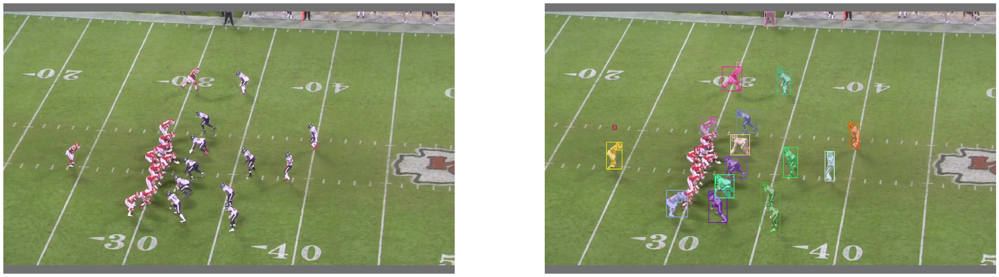

In [18]:
%matplotlib inline
plot_results(image, nimg, pred_masks_np, nbboxes, pred_cls, pred_conf, frame_helmets, plot_labels=False)

In [19]:
import pandas as pd

tr_tracking = pd.read_csv('/kaggle/input/nfl-player-contact-detection/train_player_tracking.csv')
tr_tracking.head()

,game_play,game_key,play_id,nfl_player_id,datetime,...,distance,direction,orientation,acceleration,sa
0,58580_001136,58580,1136,44830,2021-10-10T21:08:20.900Z,...,0.11,320.33,263.93,0.71,-0.64
1,58580_001136,58580,1136,47800,2021-10-10T21:08:20.900Z,...,0.01,346.84,247.16,1.29,0.90
2,58580_001136,58580,1136,52444,2021-10-10T21:08:20.900Z,...,0.06,11.77,247.69,0.63,-0.33
3,58580_001136,58580,1136,46206,2021-10-10T21:08:20.900Z,...,0.04,127.85,63.63,0.69,0.62
4,58580_001136,58580,1136,52663,2021-10-10T21:08:20.900Z,...,0.05,183.62,253.71,0.31,0.31


In [20]:
te_tracking = pd.read_csv('/kaggle/input/nfl-player-contact-detection/test_player_tracking.csv', parse_dates=["datetime"])
te_tracking.head()

,game_play,game_key,play_id,nfl_player_id,datetime,...,distance,direction,orientation,acceleration,sa
0,58172_003247,58172,3247,41937,2020-09-13 19:30:20.200000+00:00,...,0.46,20.74,12.43,3.13,3.00
1,58172_003247,58172,3247,45345,2020-09-13 19:30:20.200000+00:00,...,0.32,179.52,184.91,1.87,-1.81
2,58172_003247,58172,3247,46205,2020-09-13 19:30:20.200000+00:00,...,0.20,6.73,339.85,0.69,-0.68
3,58172_003247,58172,3247,43406,2020-09-13 19:30:20.200000+00:00,...,0.18,330.50,344.03,0.62,0.39
4,58172_003247,58172,3247,48233,2020-09-13 19:30:20.200000+00:00,...,0.34,166.59,180.56,0.88,-0.87


In [21]:
tr_video_metadata = pd.read_csv('/kaggle/input/nfl-player-contact-detection/train_video_metadata.csv',parse_dates=["start_time", "end_time", "snap_time"])
tr_video_metadata.head()

,game_play,game_key,play_id,view,start_time,end_time,snap_time
0,58168_003392,58168,3392,Endzone,2020-09-11 03:01:43.134000+00:00,2020-09-11 03:01:54.971000+00:00,2020-09-11 03:01:48.134000+00:00
1,58168_003392,58168,3392,Sideline,2020-09-11 03:01:43.134000+00:00,2020-09-11 03:01:54.971000+00:00,2020-09-11 03:01:48.134000+00:00
2,58172_003247,58172,3247,Endzone,2020-09-13 19:30:42.414000+00:00,2020-09-13 19:31:00.524000+00:00,2020-09-13 19:30:47.414000+00:00
3,58172_003247,58172,3247,Sideline,2020-09-13 19:30:42.414000+00:00,2020-09-13 19:31:00.524000+00:00,2020-09-13 19:30:47.414000+00:00
4,58173_003606,58173,3606,Endzone,2020-09-13 19:45:07.527000+00:00,2020-09-13 19:45:26.438000+00:00,2020-09-13 19:45:12.527000+00:00


In [22]:
import os
import cv2
import subprocess
from IPython.display import Video, display
import pandas as pd


def video_with_helmets(
    video_path: str, baseline_boxes: pd.DataFrame, verbose=True
) -> str:
    """
    Annotates a video with baseline model boxes and labels.
    """
    VIDEO_CODEC = "MP4V"
    HELMET_COLOR = (0, 0, 0)  # Black
    video_name = os.path.basename(video_path)
    if verbose:
        print(f"Running for {video_name}")
    baseline_boxes = baseline_boxes.copy()

    vidcap = cv2.VideoCapture(video_path)
    fps = vidcap.get(cv2.CAP_PROP_FPS)
    width = int(vidcap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(vidcap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    output_path = "labeled_" + video_name
    tmp_output_path = "tmp_" + output_path
    output_video = cv2.VideoWriter(
        tmp_output_path, cv2.VideoWriter_fourcc(*VIDEO_CODEC), fps, (width, height)
    )

    frame = 0
    while True:
        it_worked, img = vidcap.read()
        if not it_worked:
            break
        # We need to add 1 to the frame count to match the label frame index
        # that starts at 1
        frame += 1

        # Let's add a frame index to the video so we can track where we are
        img_name = video_name.replace(".mp4", "")
        cv2.putText(
            img,
            img_name,
            (10, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            HELMET_COLOR,
            thickness=1,
        )

        cv2.putText(
            img,
            str(frame),
            (1280 - 90, 720 - 20),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            HELMET_COLOR,
            thickness=1,
        )

        # Now, add the boxes
        boxes = baseline_boxes.query("video == @video_name and frame == @frame")
        for box in boxes.itertuples(index=False):
            cv2.rectangle(
                img,
                (box.left, box.top),
                (box.left + box.width, box.top + box.height),
                HELMET_COLOR,
                thickness=1,
            )
            cv2.putText(
                img,
                box.player_label,
                (box.left + 1, max(0, box.top - 20)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                HELMET_COLOR,
                thickness=1,
            )

        output_video.write(img)
    output_video.release()
    # Not all browsers support the codec, we will re-load the file at tmp_output_path
    # and convert to a codec that is more broadly readable using ffmpeg
    if os.path.exists(output_path):
        os.remove(output_path)
    subprocess.run(
        [
            "ffmpeg",
            "-i",
            tmp_output_path,
            "-crf",
            "18",
            "-preset",
            "veryfast",
            "-hide_banner",
            "-loglevel",
            "error",
            "-vcodec",
            "libx264",
            output_path,
        ]
    )
    os.remove(tmp_output_path)

    return output_path

In [23]:
example_video = '/kaggle/input/nfl-player-contact-detection/train/58168_003392_Sideline.mp4'
output_video = video_with_helmets(example_video, tr_helmets)

frac = 0.65  # scaling factor for display
display(
    Video(data=output_video, embed=True, height=int(720 * frac), width=int(1280 * frac))
)

Running for 58168_003392_Sideline.mp4


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [24]:
import matplotlib.patches as patches
import matplotlib.pylab as plt

def create_football_field(
    linenumbers=True,
    endzones=True,
    figsize=(12, 6.33),
    line_color="black",
    field_color="white",
    ez_color=None,
    ax=None,
    return_fig=False,
):
    """
    Function that plots the football field for viewing plays.
    Allows for showing or hiding endzones.
    """

    if ez_color is None:
        ez_color = field_color

    rect = patches.Rectangle(
        (0, 0),
        120,
        53.3,
        linewidth=0.1,
        edgecolor="r",
        facecolor=field_color,
        zorder=0,
    )

    if ax is None:
        fig, ax = plt.subplots(1, figsize=figsize)
    ax.add_patch(rect)
    ax.plot([10, 10, 10, 20, 20, 30, 30, 40, 40, 50, 50, 60, 60, 70, 70, 80,
              80, 90, 90, 100, 100, 110, 110, 120, 0, 0, 120, 120],
             [0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3,
              53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 53.3, 0, 0, 53.3],
             color=line_color)
    
    # Endzones
    if endzones:
        ez1 = patches.Rectangle(
            (0, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor=line_color,
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ez2 = patches.Rectangle(
            (110, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor=line_color,
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ax.add_patch(ez1)
        ax.add_patch(ez2)

    ax.axis("off")
    if linenumbers:
        for x in range(20, 110, 10):
            numb = x
            if x > 50:
                numb = 120 - x
            ax.text(
                x,
                5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color=line_color,
            )
            ax.text(
                x - 0.95,
                53.3 - 5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color=line_color,
                rotation=180,
            )
    if endzones:
        hash_range = range(11, 110)
    else:
        hash_range = range(1, 120)

    for x in hash_range:
        ax.plot([x, x], [0.4, 0.7], color=line_color)
        ax.plot([x, x], [53.0, 52.5], color=line_color)
        ax.plot([x, x], [22.91, 23.57], color=line_color)
        ax.plot([x, x], [29.73, 30.39], color=line_color)

    border = patches.Rectangle(
        (-5, -5),
        120 + 10,
        53.3 + 10,
        linewidth=0.1,
        edgecolor="orange",
        facecolor=line_color,
        alpha=0,
        zorder=0,
    )
    ax.add_patch(border)
    ax.set_xlim((-5, 125))
    ax.set_ylim((-5, 53.3 + 5))

    if return_fig:
        return fig, ax
    else:
        return ax

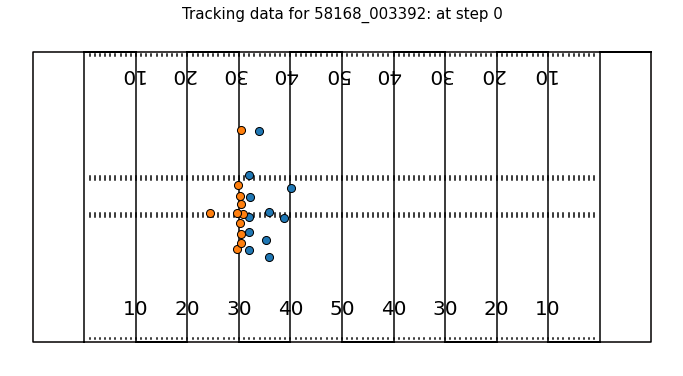

In [25]:
game_play = "58168_003392"
example_tracks = tr_tracking.query("game_play == @game_play and step == 0")
ax = create_football_field()
for team, d in example_tracks.groupby("team"):
    ax.scatter(
        d["x_position"],
        d["y_position"],
        label=team,
        s=65,
        lw=1,
        edgecolors="black",
        zorder=5,
    )
ax.legend().remove()
ax.set_title(f"Tracking data for {game_play}: at step 0", fontsize=15)
plt.show()